Training the unet, first finetuning with the resnet frozen, then finetuning whole thing.
Working now with larger dataset, 629 curated files.

In [1]:
from keras.applications.resnet50 import ResNet50
from keras.applications.resnet50 import preprocess_input, decode_predictions
from keras.preprocessing import image
from keras.models import Model
from keras.layers import Conv2D, UpSampling2D, Input, concatenate
import numpy as np
import matplotlib.image as mpimg
import os
import matplotlib.pyplot as plt
from importlib import reload

Using TensorFlow backend.


In [2]:
import unetModel

In [3]:
import generators

In [4]:
img_width = 768
img_height = 768
img_size = (img_height, img_width)
seed = 42
baseDir = '/home/ubuntu/notebooks/shipid/data/morebigboats'
imgDir = os.path.join(baseDir, 'images')
maskDir = os.path.join(baseDir, 'masks')

testBaseDir = '/home/ubuntu/notebooks/shipid/data/test'
testImgDir = os.path.join(testBaseDir, 'images')
testMaskDir = os.path.join(testBaseDir, 'masks')

# Have to use 2 have unfreeze entire model, to avoid OOM errors.
batchSize = 2
#batchSize = 3

In [19]:
#reload(create_unet)

<module 'create_unet' from '/home/gregw/code/Kaggle/ShipId/kerasUnet/create_unet.py'>

In [5]:
import keras
keras.__version__

'2.2.4'

In [6]:
#reload(unetModel)
#myU = unetModel.getUnet()
myU = unetModel.getUnet('freeze4c.h5')

Instructions for updating:
Colocations handled automatically by placer.


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


In [7]:
myU.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 768, 768, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 774, 774, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 384, 384, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 384, 384, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [7]:
def weighted_cross_entropy(beta):
  def convert_to_logits(y_pred):
      # see https://github.com/tensorflow/tensorflow/blob/r1.10/tensorflow/python/keras/backend.py#L3525
      y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())

      return tf.log(y_pred / (1 - y_pred))

  def wce_loss(y_true, y_pred):
    y_pred = convert_to_logits(y_pred)
    wce_loss = tf.nn.weighted_cross_entropy_with_logits(logits=y_pred, targets=y_true, pos_weight=beta)

    return tf.reduce_mean(wce_loss)

  return wce_loss

In [8]:
def tversky_loss(beta):
  def tv_loss(y_true, y_pred):
    numerator = tf.reduce_sum(y_true * y_pred)
    denominator = y_true * y_pred + beta * (1 - y_true) * y_pred + (1 - beta) * y_true * (1 - y_pred)

    return numerator / (tf.reduce_sum(denominator) + tf.keras.backend.epsilon())

  return tv_loss

In [15]:
reload(generators)

<module 'generators' from '/home/ubuntu/notebooks/shipid/kerasUnet/generators.py'>

In [9]:
train_gen, valid_gen = generators.getTrainValidGenerators(imgDir, maskDir, 0.20, img_size, batchSize)

Found 501 images belonging to 1 classes.
Found 501 images belonging to 1 classes.
Found 125 images belonging to 1 classes.
Found 125 images belonging to 1 classes.


In [10]:
from keras.optimizers import *
beta = 4.0
tv_beta = 0.8
#myU.compile(optimizer = Adam(lr = 1e-4), loss = keras.losses.binary_crossentropy, 
#            metrics = ['accuracy', weighted_cross_entropy(beta), tversky_loss(tv_beta)])
myU.compile(optimizer = Adam(lr = 1e-4), loss = weighted_cross_entropy(beta), 
            metrics = ['accuracy', weighted_cross_entropy(beta), keras.losses.binary_crossentropy, tversky_loss(tv_beta)])


In [15]:
myU.fit_generator( 
            train_gen,
            steps_per_epoch = 167,
            validation_data = valid_gen,
            validation_steps = 41,
            epochs = 3
            )

Epoch 1/3
167/167 [==============================] - 686s 4s/step - loss: 0.0552 - acc: 0.9929 - wce_loss: 0.0552 - binary_crossentropy: 0.0271 - tv_loss: 0.2934 - val_loss: 0.0818 - val_acc: 0.9944 - val_wce_loss: 0.0818 - val_binary_crossentropy: 0.0255 - val_tv_loss: 0.2951
Epoch 2/3
167/167 [==============================] - 700s 4s/step - loss: 0.0312 - acc: 0.9937 - wce_loss: 0.0312 - binary_crossentropy: 0.0169 - tv_loss: 0.4028 - val_loss: 0.0431 - val_acc: 0.9956 - val_wce_loss: 0.0431 - val_binary_crossentropy: 0.0151 - val_tv_loss: 0.3749
Epoch 3/3
167/167 [==============================] - 687s 4s/step - loss: 0.0273 - acc: 0.9943 - wce_loss: 0.0273 - binary_crossentropy: 0.0151 - tv_loss: 0.4314 - val_loss: 0.0622 - val_acc: 0.9960 - val_wce_loss: 0.0622 - val_binary_crossentropy: 0.0173 - val_tv_loss: 0.4440


In [16]:
myU.save('freeze4.h5')

In [47]:
myU.fit_generator( 
            train_gen,
            steps_per_epoch = 167,
            validation_data = valid_gen,
            validation_steps = 41,
            epochs = 3
            )

Epoch 1/3
167/167 [==============================] - 684s 4s/step - loss: 0.0302 - acc: 0.9948 - wce_loss: 0.0302 - binary_crossentropy: 0.0158 - tv_loss: 0.4485 - val_loss: 0.0865 - val_acc: 0.9950 - val_wce_loss: 0.0865 - val_binary_crossentropy: 0.0251 - val_tv_loss: 0.3833
Epoch 2/3
167/167 [==============================] - 675s 4s/step - loss: 0.0213 - acc: 0.9950 - wce_loss: 0.0213 - binary_crossentropy: 0.0122 - tv_loss: 0.4883 - val_loss: 0.0484 - val_acc: 0.9963 - val_wce_loss: 0.0484 - val_binary_crossentropy: 0.0141 - val_tv_loss: 0.4710
Epoch 3/3
167/167 [==============================] - 662s 4s/step - loss: 0.0199 - acc: 0.9953 - wce_loss: 0.0199 - binary_crossentropy: 0.0114 - tv_loss: 0.5101 - val_loss: 0.0589 - val_acc: 0.9961 - val_wce_loss: 0.0589 - val_binary_crossentropy: 0.0160 - val_tv_loss: 0.5068


In [48]:
myU.save('freeze4a.h5')

In [12]:
myU.fit_generator( 
            train_gen,
            steps_per_epoch = 167,
            validation_data = valid_gen,
            validation_steps = 41,
            epochs = 6
            )

Epoch 1/6
167/167 [==============================] - 728s 4s/step - loss: 0.0593 - acc: 0.9918 - wce_loss: 0.0593 - binary_crossentropy: 0.0287 - tv_loss: 0.3485 - val_loss: 0.0736 - val_acc: 0.9941 - val_wce_loss: 0.0736 - val_binary_crossentropy: 0.0245 - val_tv_loss: 0.2994
Epoch 2/6
167/167 [==============================] - 699s 4s/step - loss: 0.0311 - acc: 0.9935 - wce_loss: 0.0311 - binary_crossentropy: 0.0172 - tv_loss: 0.4352 - val_loss: 0.0340 - val_acc: 0.9960 - val_wce_loss: 0.0340 - val_binary_crossentropy: 0.0126 - val_tv_loss: 0.3744
Epoch 3/6
167/167 [==============================] - 686s 4s/step - loss: 0.0265 - acc: 0.9943 - wce_loss: 0.0265 - binary_crossentropy: 0.0150 - tv_loss: 0.4603 - val_loss: 0.0515 - val_acc: 0.9960 - val_wce_loss: 0.0515 - val_binary_crossentropy: 0.0146 - val_tv_loss: 0.5196
Epoch 4/6
167/167 [==============================] - 683s 4s/step - loss: 0.0268 - acc: 0.9942 - wce_loss: 0.0268 - binary_crossentropy: 0.0151 - tv_loss: 0.4938 - va

In [14]:
myU.save('freeze4b.h5')

In [27]:
myU.fit_generator( 
            train_gen,
            steps_per_epoch = 167,
            validation_data = valid_gen,
            validation_steps = 41,
            epochs = 3
            )

Epoch 1/3
167/167 [==============================] - 683s 4s/step - loss: 0.0406 - acc: 0.9936 - wce_loss: 0.0406 - binary_crossentropy: 0.0209 - tv_loss: 0.4309 - val_loss: 0.0681 - val_acc: 0.9949 - val_wce_loss: 0.0681 - val_binary_crossentropy: 0.0226 - val_tv_loss: 0.3617
Epoch 2/3
167/167 [==============================] - 686s 4s/step - loss: 0.0201 - acc: 0.9953 - wce_loss: 0.0201 - binary_crossentropy: 0.0115 - tv_loss: 0.5072 - val_loss: 0.0518 - val_acc: 0.9958 - val_wce_loss: 0.0518 - val_binary_crossentropy: 0.0159 - val_tv_loss: 0.5102
Epoch 3/3
167/167 [==============================] - 685s 4s/step - loss: 0.0210 - acc: 0.9951 - wce_loss: 0.0210 - binary_crossentropy: 0.0120 - tv_loss: 0.5305 - val_loss: 0.0359 - val_acc: 0.9963 - val_wce_loss: 0.0359 - val_binary_crossentropy: 0.0118 - val_tv_loss: 0.4944


In [32]:
myU.save('freeze4c.h5')

In [11]:
unetModel.unfreezeResnet(myU)

In [12]:
for layer in myU.layers:
    print( layer.trainable)

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [12]:
myU.compile(optimizer = Adam(lr = 1e-5), loss = weighted_cross_entropy(beta), 
            metrics = ['accuracy', weighted_cross_entropy(beta), keras.losses.binary_crossentropy, tversky_loss(tv_beta)])


In [13]:
# Unfroze resnet50, reduced learning rate, see where training goes.
myU.fit_generator( 
            train_gen,
            steps_per_epoch = 250,
            validation_data = valid_gen,
            validation_steps = 62,
            epochs = 3
            )

Epoch 1/3
250/250 [==============================] - 917s 4s/step - loss: 0.0195 - acc: 0.9957 - wce_loss: 0.0195 - binary_crossentropy: 0.0108 - tv_loss: 0.4983 - val_loss: 0.0394 - val_acc: 0.9959 - val_wce_loss: 0.0394 - val_binary_crossentropy: 0.0129 - val_tv_loss: 0.4329
Epoch 2/3
250/250 [==============================] - 893s 4s/step - loss: 0.0154 - acc: 0.9962 - wce_loss: 0.0154 - binary_crossentropy: 0.0090 - tv_loss: 0.5287 - val_loss: 0.0274 - val_acc: 0.9966 - val_wce_loss: 0.0274 - val_binary_crossentropy: 0.0097 - val_tv_loss: 0.4746
Epoch 3/3
250/250 [==============================] - 870s 3s/step - loss: 0.0145 - acc: 0.9964 - wce_loss: 0.0145 - binary_crossentropy: 0.0084 - tv_loss: 0.5411 - val_loss: 0.0296 - val_acc: 0.9960 - val_wce_loss: 0.0296 - val_binary_crossentropy: 0.0119 - val_tv_loss: 0.4436


In [22]:
myU.save('unfreeze4d.h5')

In [29]:
myU.fit_generator( 
            train_gen,
            steps_per_epoch = 250,
            validation_data = valid_gen,
            validation_steps = 62,
            epochs = 6
            )

Epoch 1/6
250/250 [==============================] - 867s 3s/step - loss: 0.0206 - acc: 0.9963 - wce_loss: 0.0206 - binary_crossentropy: 0.0109 - tv_loss: 0.4911 - val_loss: 0.0476 - val_acc: 0.9946 - val_wce_loss: 0.0476 - val_binary_crossentropy: 0.0188 - val_tv_loss: 0.3872
Epoch 2/6
250/250 [==============================] - 870s 3s/step - loss: 0.0142 - acc: 0.9966 - wce_loss: 0.0142 - binary_crossentropy: 0.0082 - tv_loss: 0.5593 - val_loss: 0.0184 - val_acc: 0.9958 - val_wce_loss: 0.0184 - val_binary_crossentropy: 0.0107 - val_tv_loss: 0.4554
Epoch 3/6
250/250 [==============================] - 870s 3s/step - loss: 0.0126 - acc: 0.9967 - wce_loss: 0.0126 - binary_crossentropy: 0.0075 - tv_loss: 0.5673 - val_loss: 0.0306 - val_acc: 0.9949 - val_wce_loss: 0.0306 - val_binary_crossentropy: 0.0138 - val_tv_loss: 0.4891
Epoch 4/6
250/250 [==============================] - 869s 3s/step - loss: 0.0124 - acc: 0.9968 - wce_loss: 0.0124 - binary_crossentropy: 0.0074 - tv_loss: 0.5757 - va

In [40]:
myU.save('unfreeze4e.h5')

In [30]:
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator


In [31]:
test_dir = '/home/ubuntu/notebooks/shipid/data/test/images'
test_datagen = ImageDataGenerator()

In [32]:
test_generator = test_datagen.flow_from_directory(test_dir, target_size=(768,768), batch_size=1, class_mode=None)

Found 215 images belonging to 1 classes.


In [20]:
y_pred1 = myU.predict_generator(test_generator, verbose=1, steps=10)

10/10 [==============================] - 18s 2s/step


In [17]:
mask_dir = '/home/ubuntu/notebooks/shipid/data/bigboats/masks'
#mk = mpimg.imread(os.path.join(mask_dir,fn))

In [20]:
i = 0
for fileIdx in test_generator.index_array:
    pred_mask = y_pred2[i]
    
    # Get name of target mask, read it in.
    fn = test_generator.filenames[fileIdx]
    base, ext = os.path.splitext(fn)
    filename = base + ".png"
    mask = mpimg.imread(os.path.join(mask_dir,filename))

    # See if nonzero pixels in target mask and predicted mask match, same with zeros.
    hits = 0
    misses = 0
    targetOnes = 0
    predOnes = 0
    for row in range(0, mask.shape[0]-1):
        for col in range(0, mask.shape[1]-1):
            if mask[row, col, 0] > 0 and pred_mask[row, col, 0] > 0:
                hits += 1
            elif mask[row, col, 0] == 0 and pred_mask[row, col, 0] == 0:
                hits += 1
            else:
                misses += 1
            if mask[row, col, 0] > 0:
                targetOnes += 1
            if pred_mask[row, col, 0] > 0:
                predOnes += 1
    print( "for image: ", filename, " had ", hits, " hits and ", misses, " misses, target ones=", targetOnes,
          ", predicted ones=", predOnes)
    i += 1


for image:  boats/00fd8e126.png  had  11293  hits and  576996  misses, target ones= 10639 , predicted ones= 587635
for image:  boats/00d0a646b.png  had  91833  hits and  496456  misses, target ones= 10844 , predicted ones= 504546
for image:  boats/0040cf4e9.png  had  11456  hits and  576833  misses, target ones= 11410 , predicted ones= 588243
for image:  boats/014c906b1.png  had  6310  hits and  581979  misses, target ones= 4697 , predicted ones= 586676
for image:  boats/016017695.png  had  4714  hits and  583575  misses, target ones= 4714 , predicted ones= 588289
for image:  boats/0106d2433.png  had  3113  hits and  585176  misses, target ones= 3061 , predicted ones= 588237
for image:  boats/0027854cc.png  had  1754  hits and  586535  misses, target ones= 1754 , predicted ones= 588289
for image:  boats/002d56570.png  had  8372  hits and  579917  misses, target ones= 1292 , predicted ones= 581187
for image:  boats/014624873.png  had  10573  hits and  577716  misses, target ones= 10573 

(array([5.74345e+05, 1.63000e+03, 7.40000e+02, 5.52000e+02, 5.08000e+02,
        5.46000e+02, 7.07000e+02, 9.92000e+02, 1.93900e+03, 7.86500e+03]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ],
       dtype=float32),
 <a list of 10 Patch objects>)

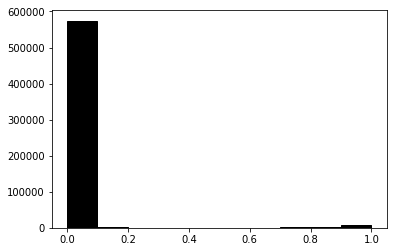

In [22]:
pred1 = y_pred1[0,:,:,0]
plt.hist(pred1.ravel(), bins=10, range=(0.0, 1.0), fc='k', ec='k')
#plt.hist(np.reshape(y_pred[0]*100000, (768, 768)), bins=[0.00000001, 0.0000001, 0.000001, 0.0001, 1])
#plt.show()

(array([5.89401e+05, 2.30000e+02, 9.00000e+01, 3.80000e+01, 2.60000e+01,
        1.70000e+01, 6.00000e+00, 1.00000e+01, 2.00000e+00, 4.00000e+00]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

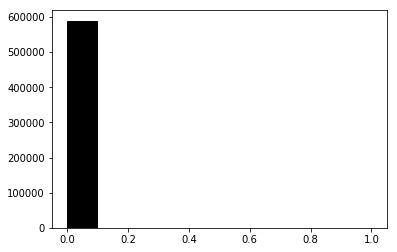

In [48]:
plt.hist(pred1.ravel(), bins=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], fc='k', ec='k')


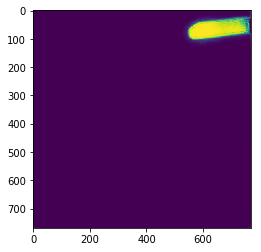

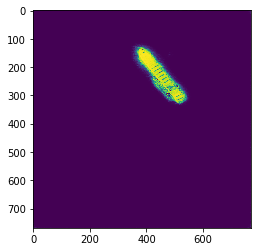

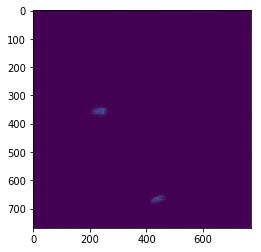

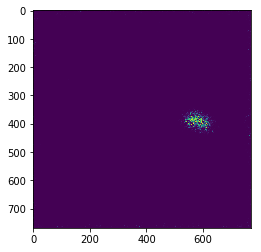

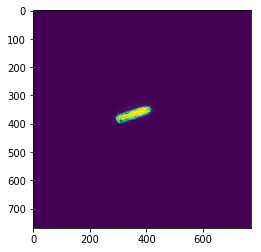

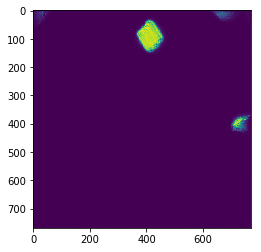

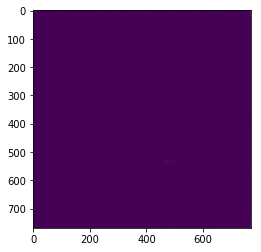

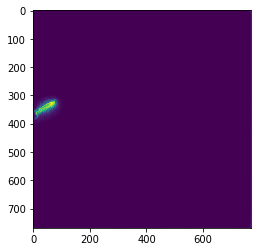

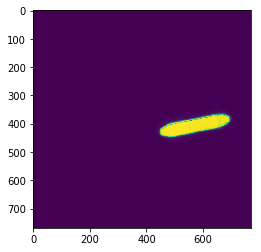

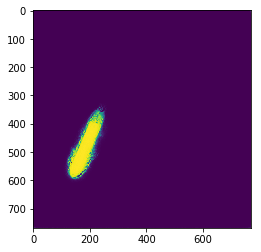

In [23]:
# Beta=4
for i in range(0, len(y_pred1)):
    plt.imshow(y_pred1[i,:,:,0])
    plt.show()

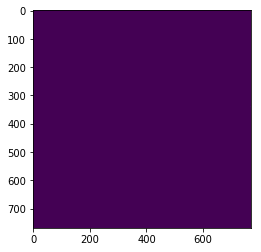

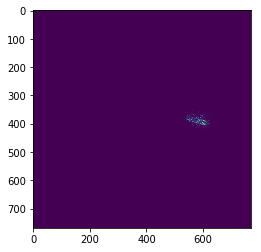

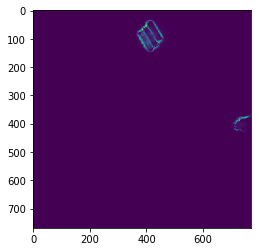

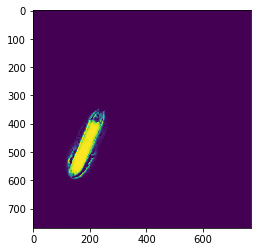

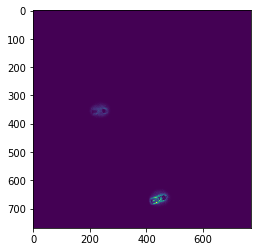

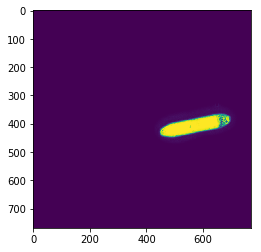

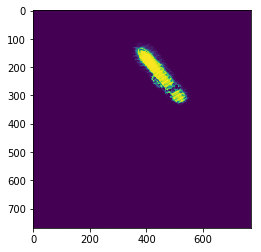

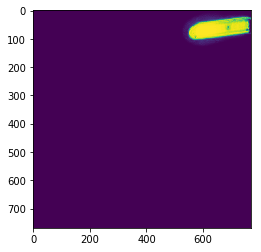

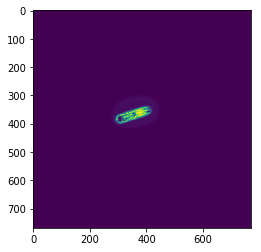

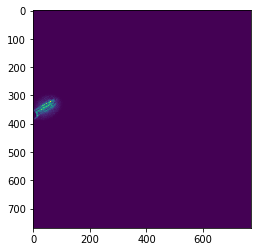

In [27]:
#Beta=4.0
for i in range(0, len(y_pred5)):
    plt.imshow(y_pred5[i,:,:,0])
    plt.show()

In [18]:
reload(generators)

<module 'generators' from '/home/ubuntu/notebooks/shipid/kerasUnet/generators.py'>

In [33]:
test_gen = generators.getTestGenerator(testImgDir, testMaskDir, img_size, batchSize)


Found 215 images belonging to 1 classes.
Found 215 images belonging to 1 classes.


In [34]:
# Need 107 steps after unfreezing, as batch size was reduced to 2
myU.evaluate_generator(test_gen, steps=107, verbose=1)
#myU.evaluate_generator(test_gen, steps=71, verbose=1)

107/107 [==============================] - 120s 1s/step


[0.022111092761559325,
 0.9970233874900318,
 0.022111092761559325,
 0.009288700709824458,
 0.5117688821140054]

In [29]:
myU.metrics_names

['loss', 'acc', 'wce_loss', 'binary_crossentropy', 'tv_loss']

In [35]:
#import displayPredVsTarget
import disp2

In [22]:
reload(disp2)

<module 'disp2' from '/home/ubuntu/notebooks/shipid/kerasUnet/disp2.py'>

In [36]:
predBase_dir = '/home/ubuntu/notebooks/shipid'
predImage_dir = os.path.join(predBase_dir, 'data/test/images/boats')
target_dir = os.path.join(predBase_dir, 'data/test/masks/boats')


In [37]:
srcFile = os.path.join(predBase_dir, 'kerasUnet/testDisplayList.txt')
fileList = []
for line in open(srcFile):
    fileList.append(line.rstrip())
fileList


['4dc952993.jpg',
 '4e3a19cf2.jpg',
 '4e4abce24.jpg',
 '4ec28a308.jpg',
 '4ec819543.jpg',
 '4f7d0e2fb.jpg',
 '4ff279eeb.jpg',
 '5e863d86e.jpg',
 '5eeaf898d.jpg',
 '6ca571ccc.jpg',
 '6d3edce0d.jpg',
 '6d41fbbbd.jpg',
 '6ef274463.jpg',
 '7bde5fb68.jpg',
 '7de65a67a.jpg',
 '8c2e17776.jpg',
 '8e9f64ef7.jpg',
 '8e27ba608.jpg',
 '9b94a756d.jpg',
 '9cb78f9e6.jpg',
 '53d7d0fc0.jpg',
 '97d3f5067.jpg',
 '986c21d85.jpg',
 '9664b3648.jpg',
 '95940e5b9.jpg',
 '840421592.jpg',
 'ad8e85621.jpg',
 'bef2e129f.jpg',
 'ca6102e69.jpg',
 'd30187b5a.jpg',
 'e4b08db5c.jpg',
 'e7b0bc853.jpg',
 'edb2f89f0.jpg',
 '']

In [38]:
# Create predicted mask for each filename in given list, so can display original image,
# target mask and predicted mask side by side.
imgData = []
for filename in fileList:
    if len(filename) > 0:
        imgFile = os.path.join(predImage_dir, filename)
        imgData.append(plt.imread(imgFile))
predMasks = myU.predict(np.array(imgData), batch_size=3, verbose=1)

33/33 [==============================] - 18s 558ms/step


In [43]:
predMasks.shape

(33, 768, 768, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


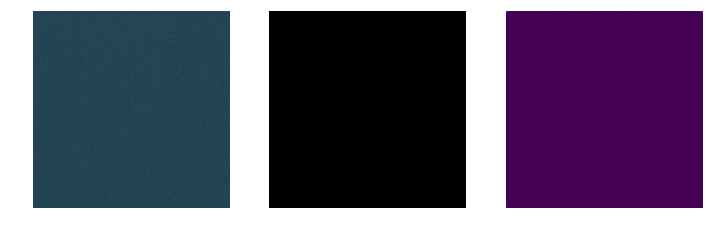

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


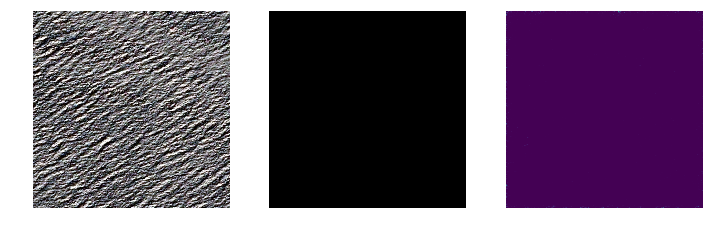

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


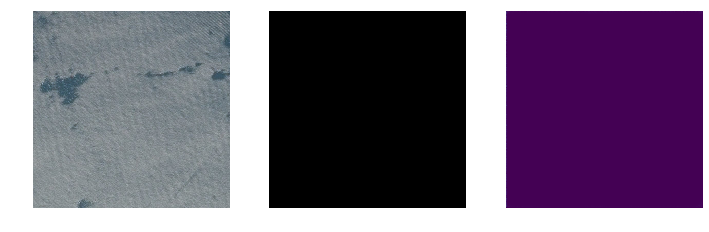

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


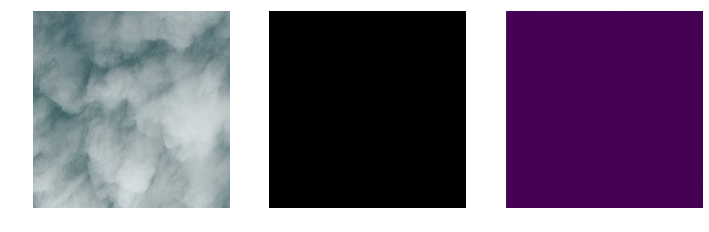

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


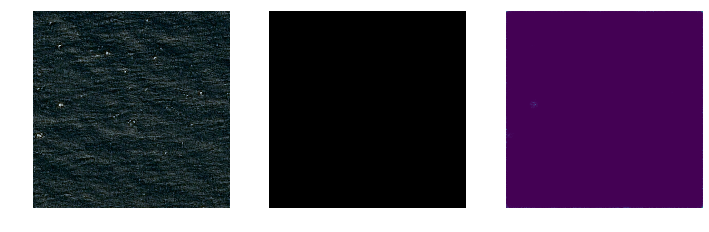

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


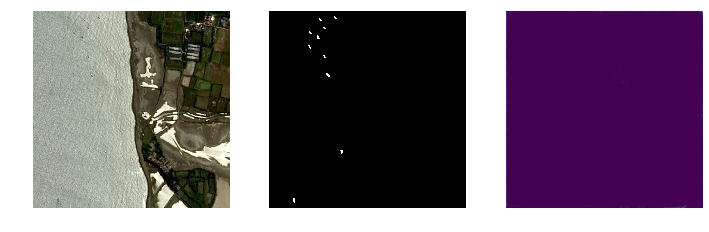

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


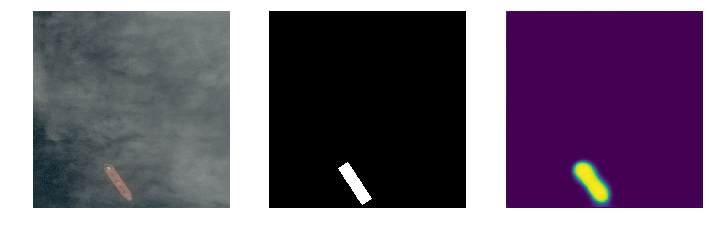

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


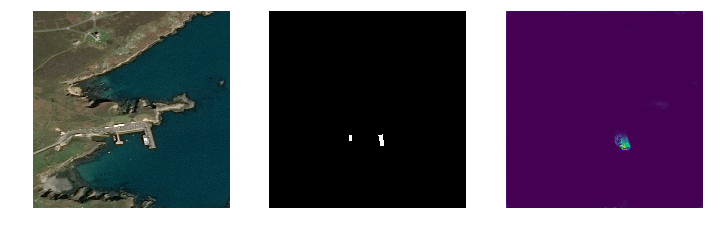

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


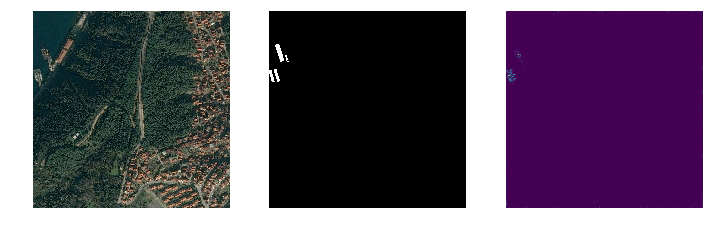

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


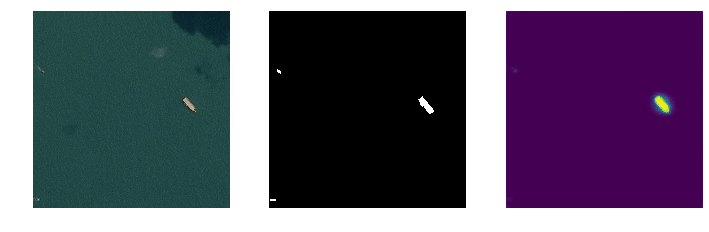

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


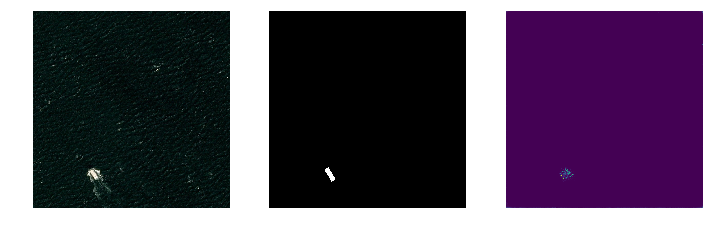

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


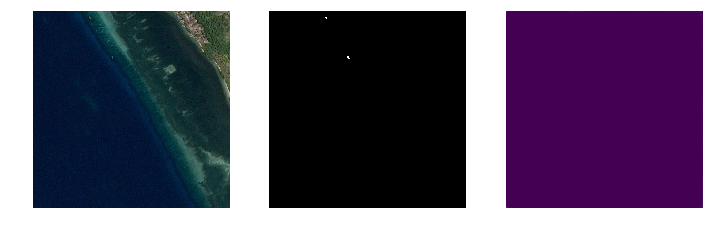

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


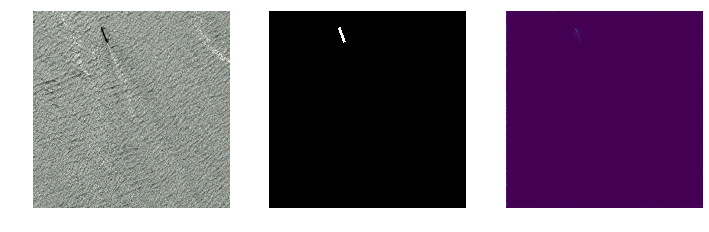

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


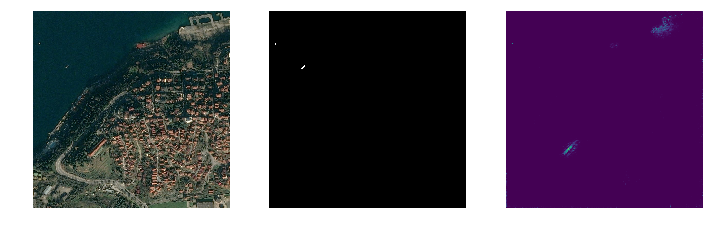

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


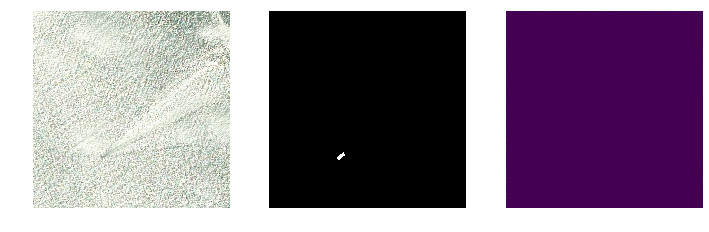

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


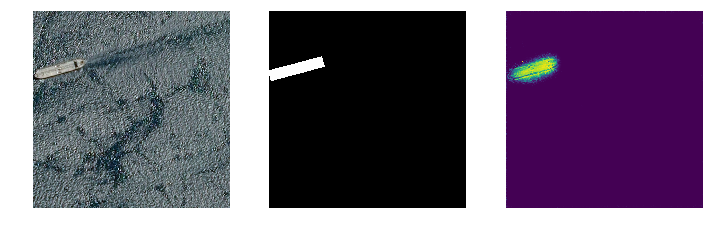

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


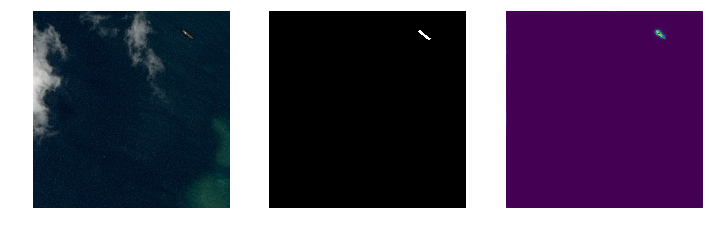

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


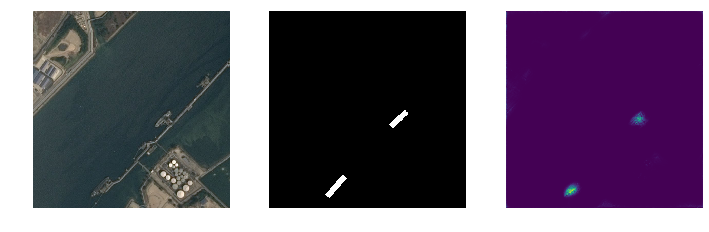

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


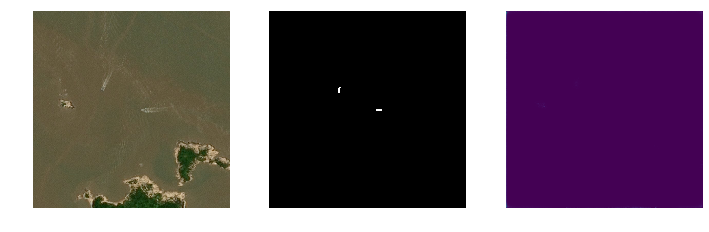

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


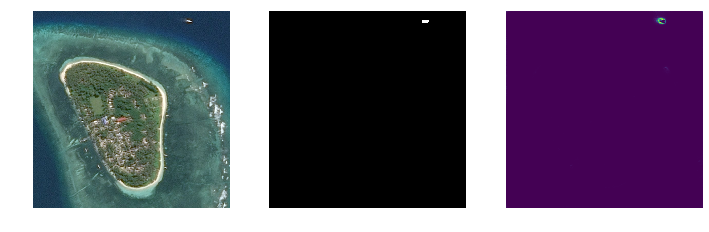

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


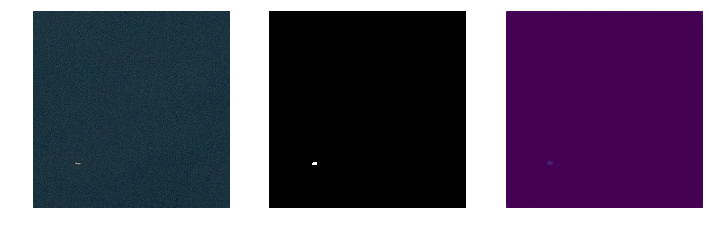

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


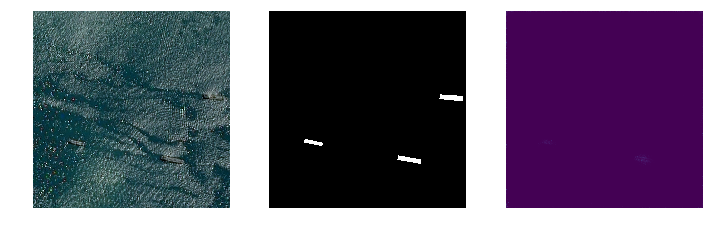

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


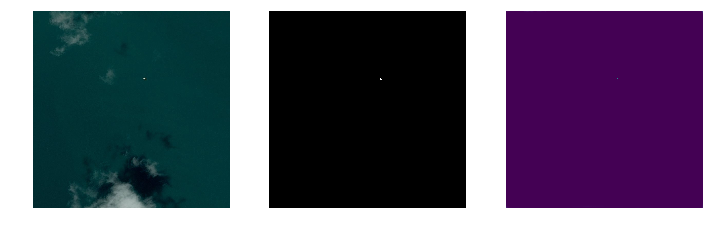

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


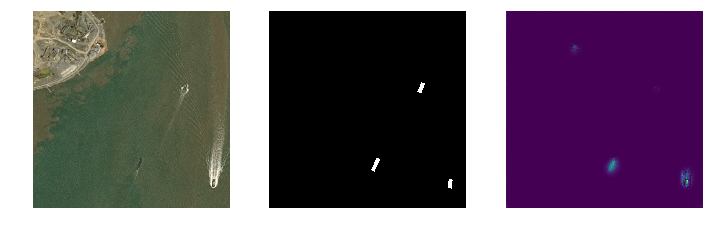

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


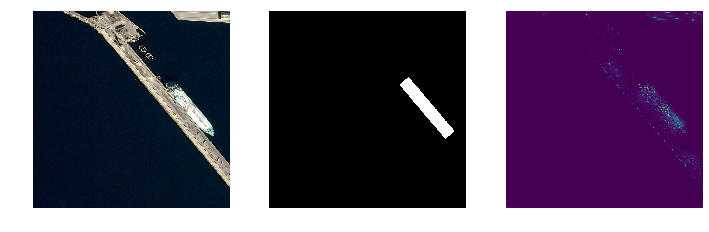

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


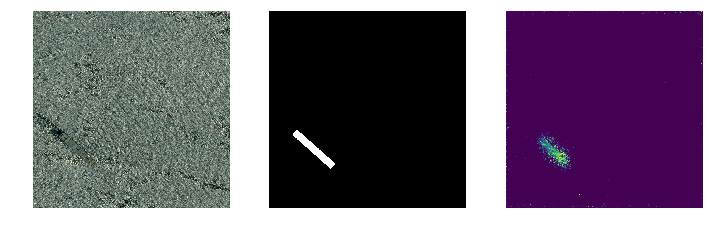

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


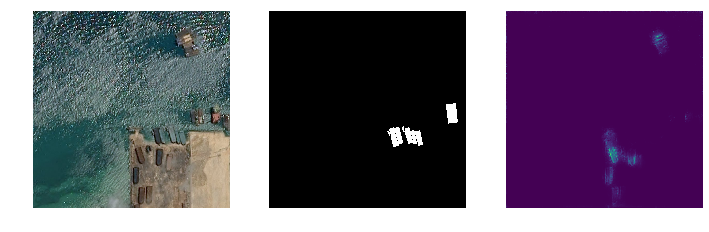

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


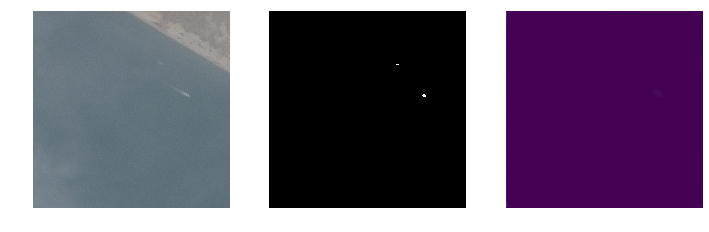

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


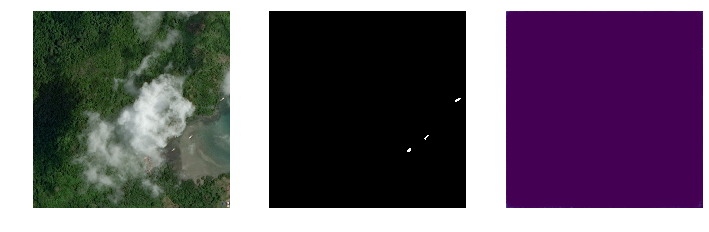

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


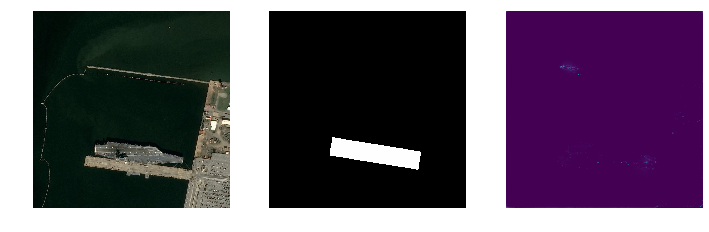

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


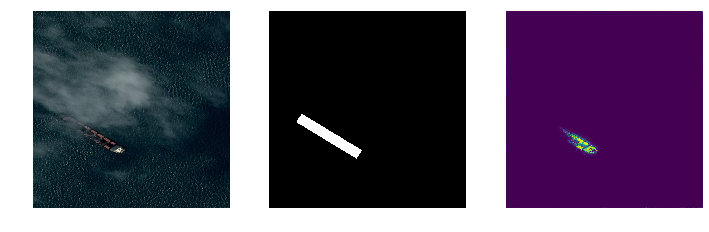

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


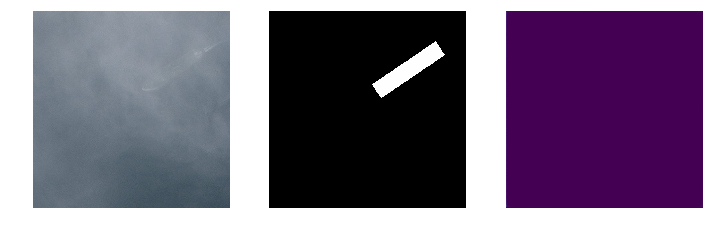

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


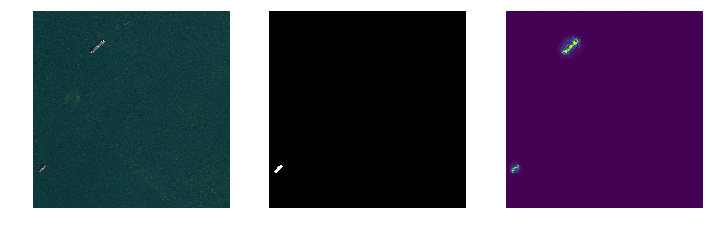

In [46]:
disp2.displayFiles(fileList, predImage_dir, target_dir, predMasks)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


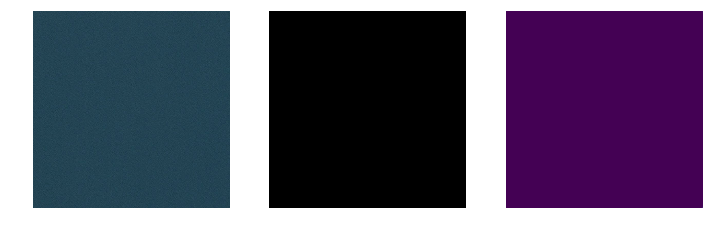

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


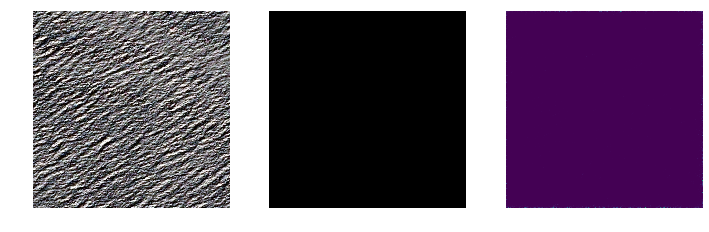

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


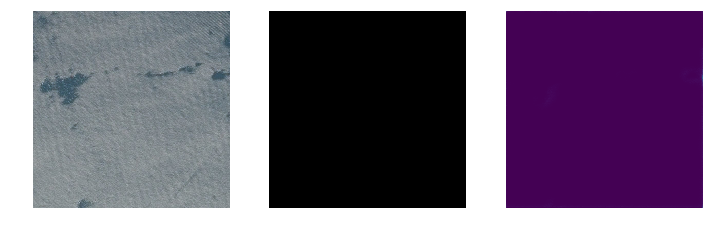

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


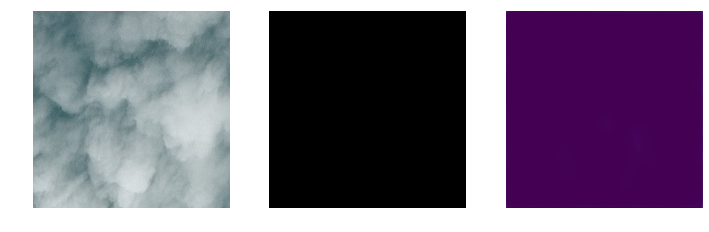

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


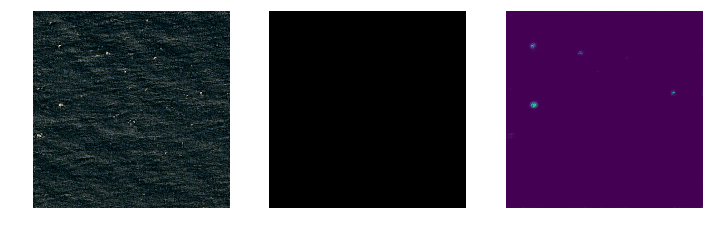

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


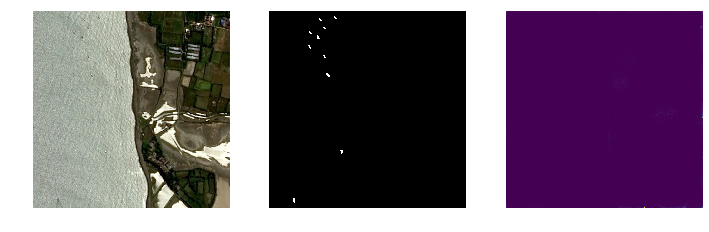

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


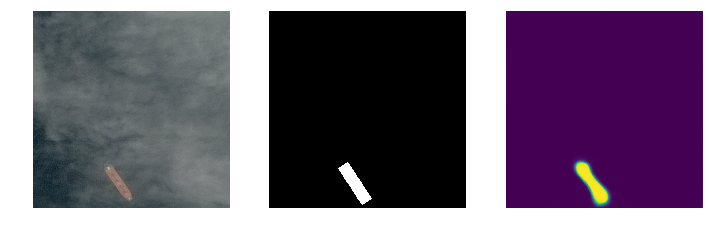

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


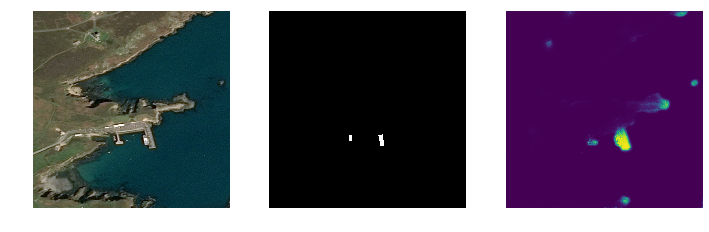

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


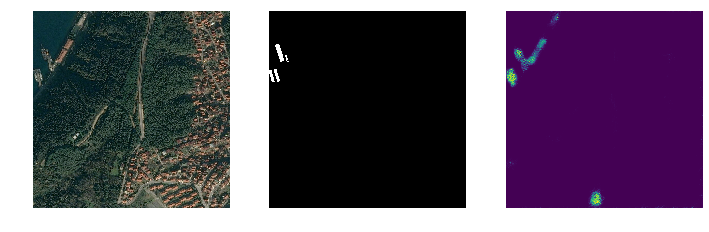

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


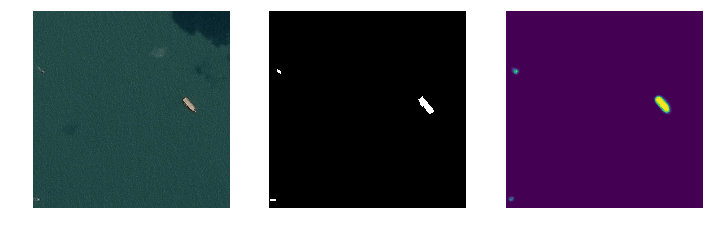

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


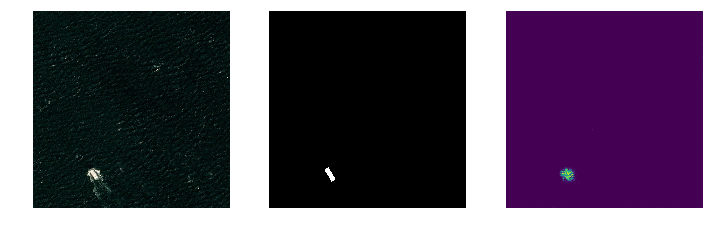

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


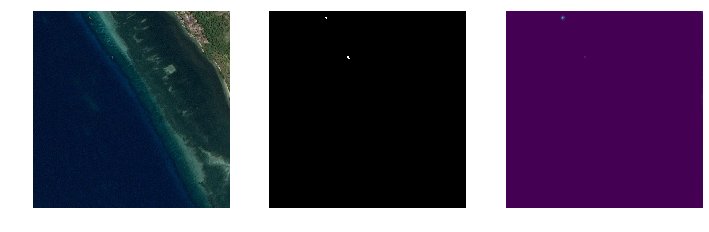

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


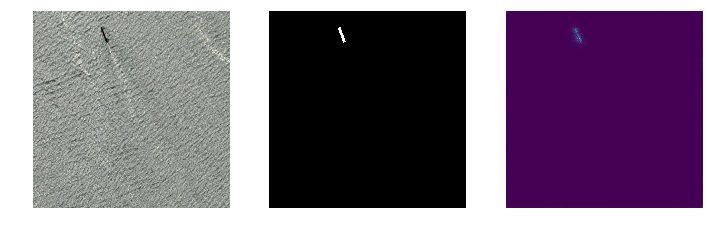

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


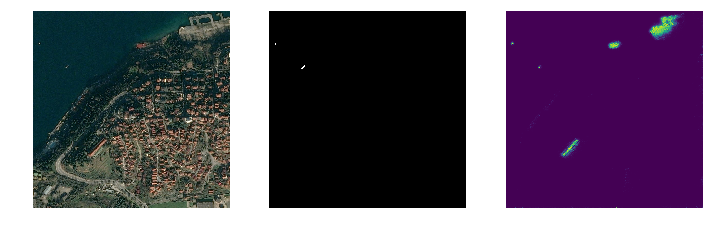

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


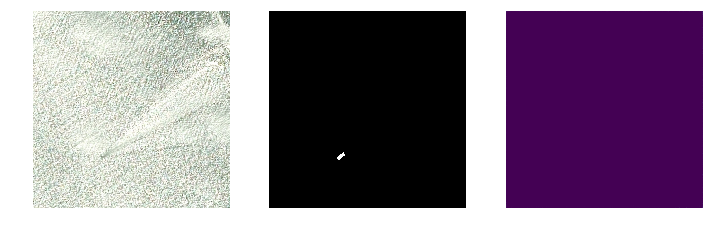

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


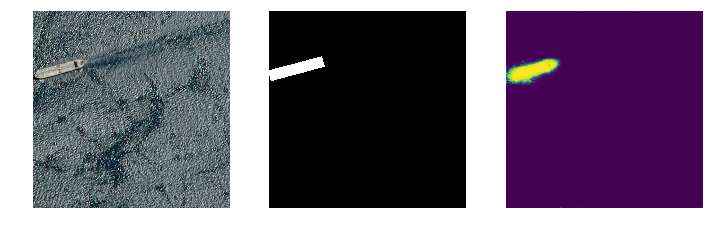

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


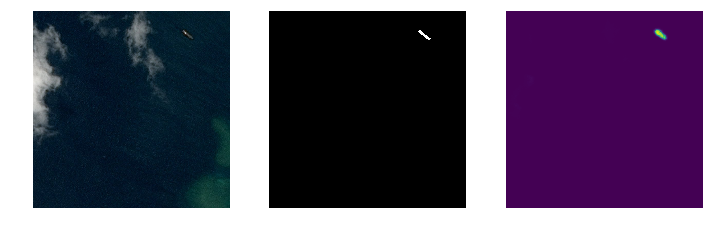

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


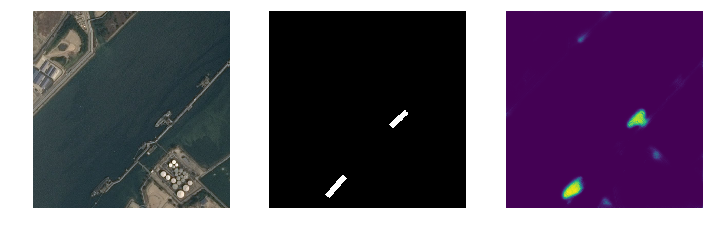

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


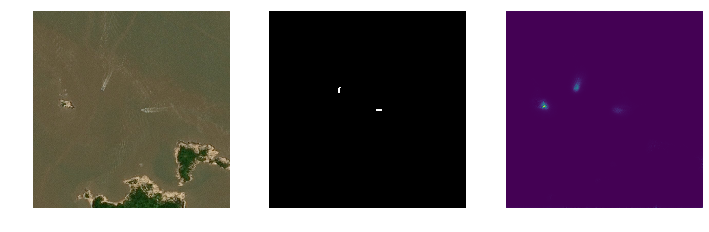

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


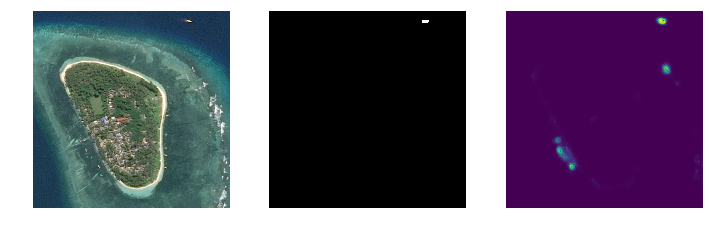

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


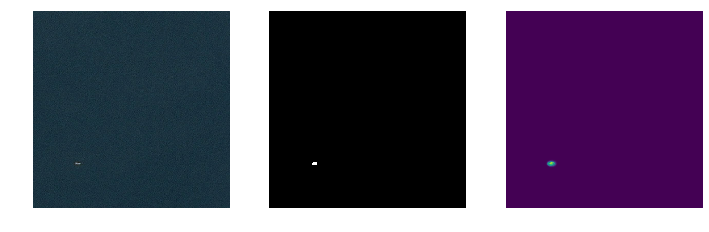

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


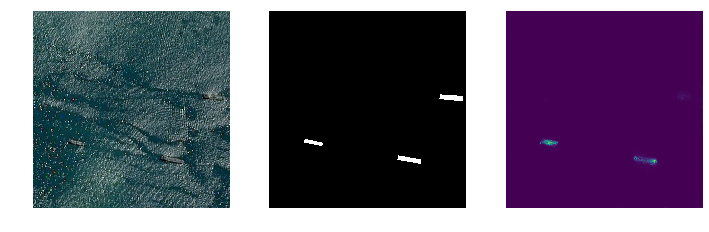

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


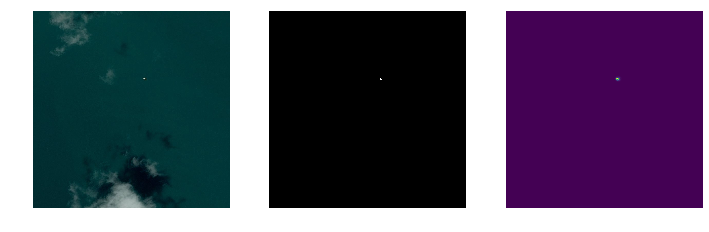

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


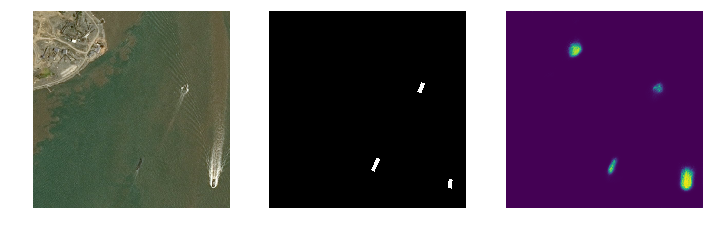

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


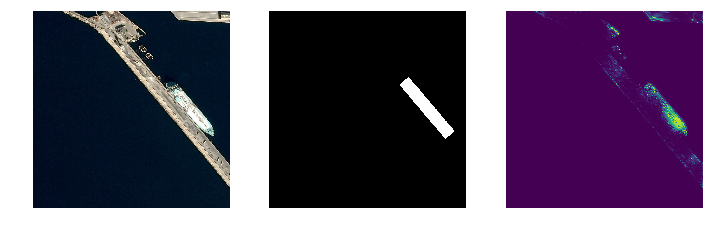

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


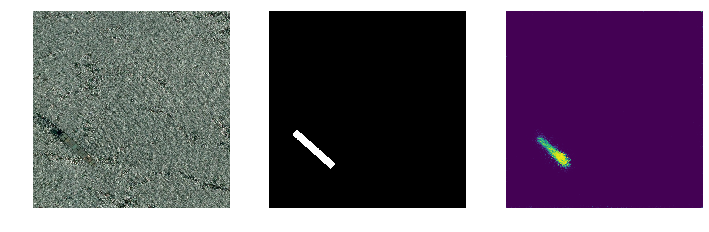

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


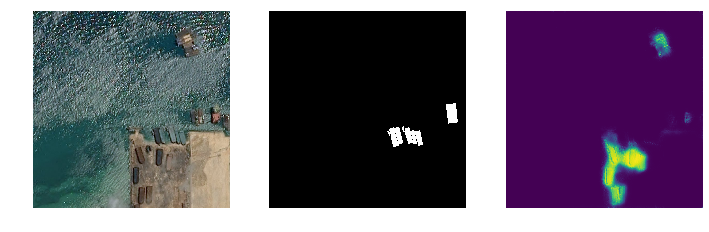

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


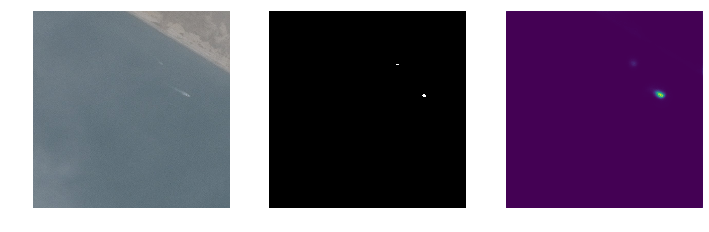

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


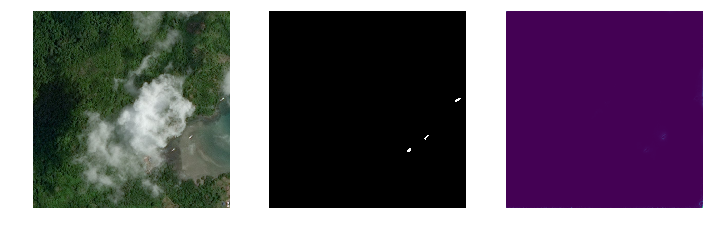

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


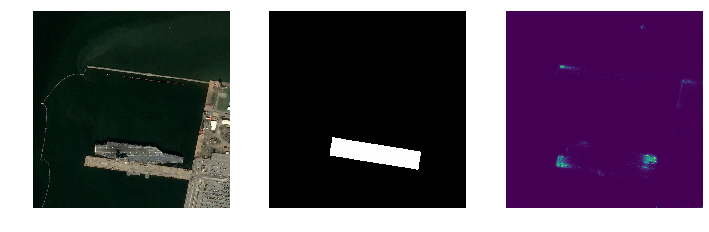

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


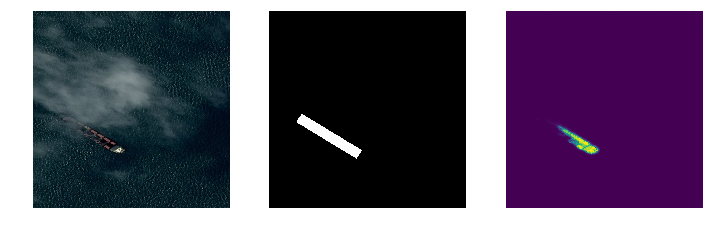

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


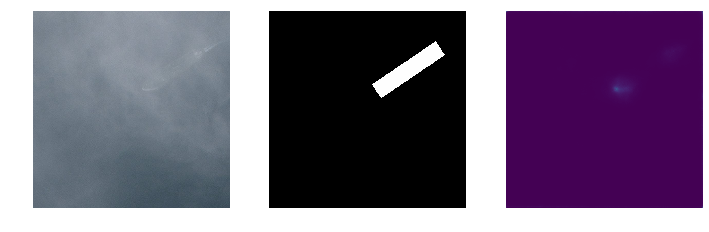

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


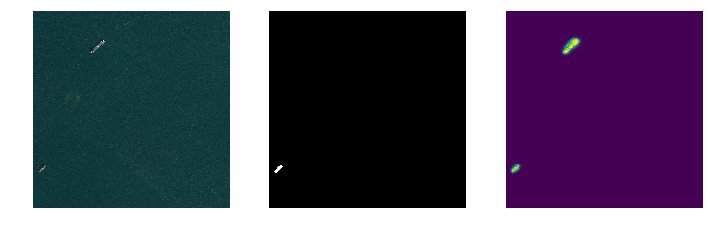

In [29]:
# After 9 more epochs - step 4.
disp2.displayFiles(fileList, predImage_dir, target_dir, predMasks)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


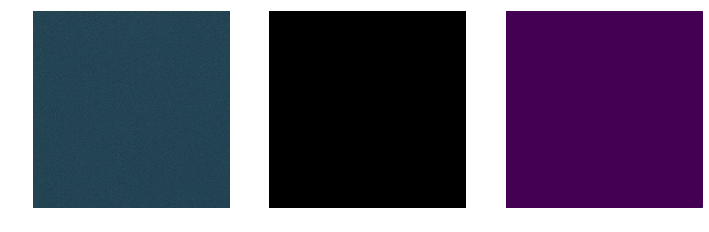

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


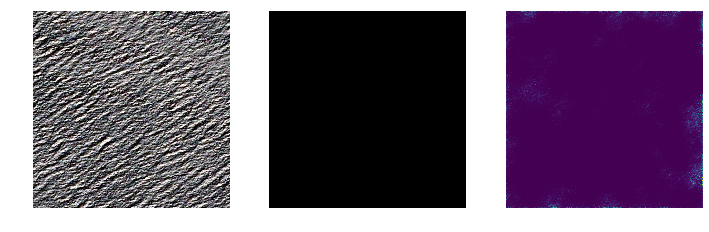

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


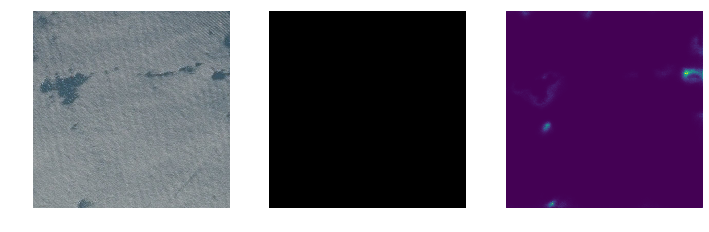

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


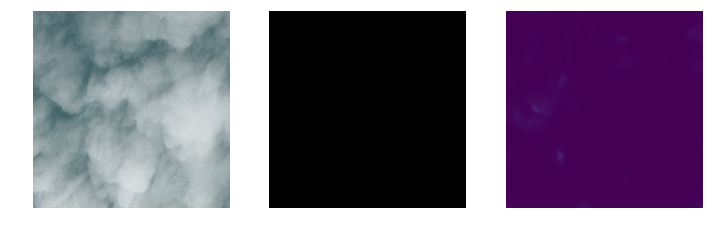

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


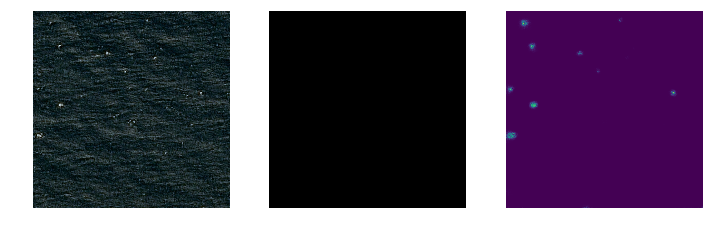

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


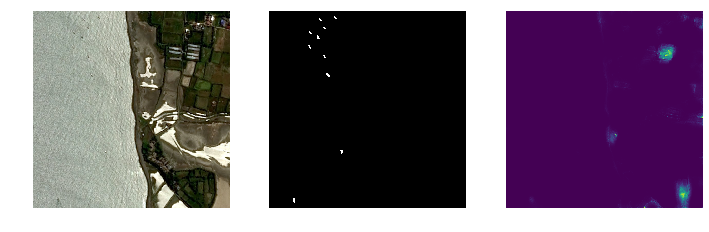

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


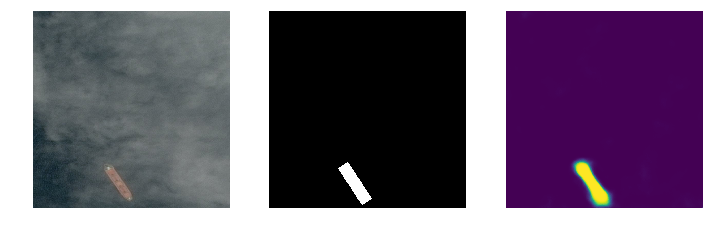

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


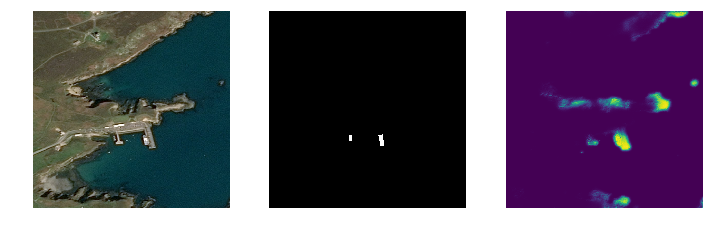

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


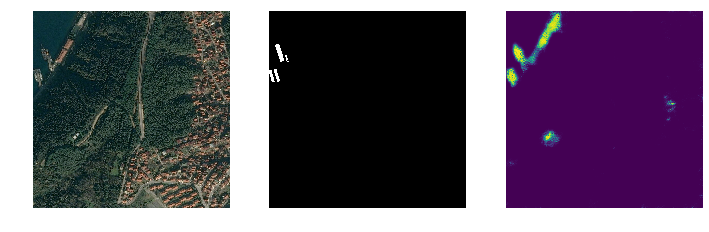

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


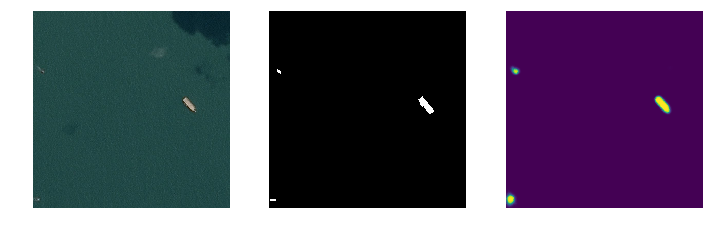

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


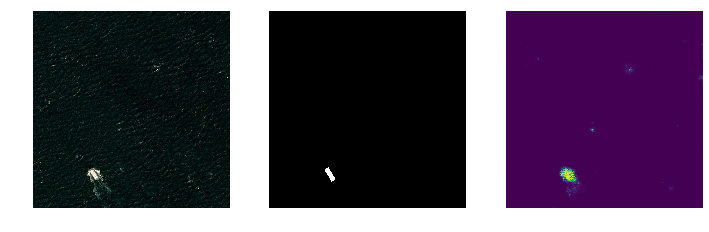

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


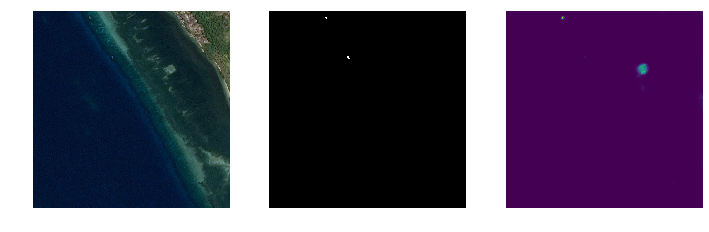

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


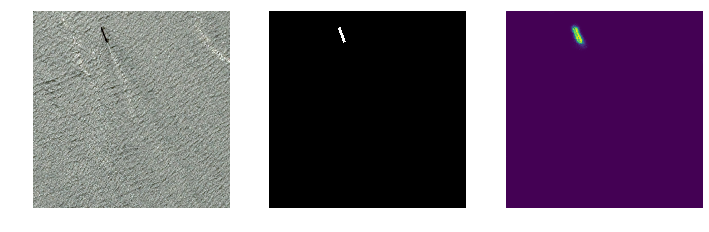

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


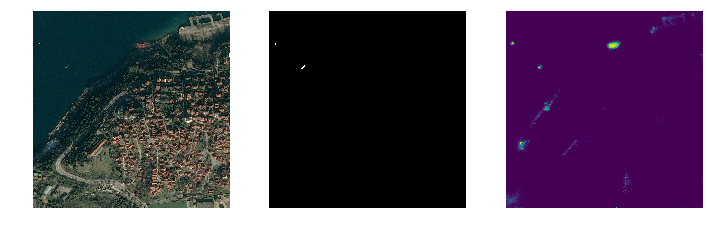

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


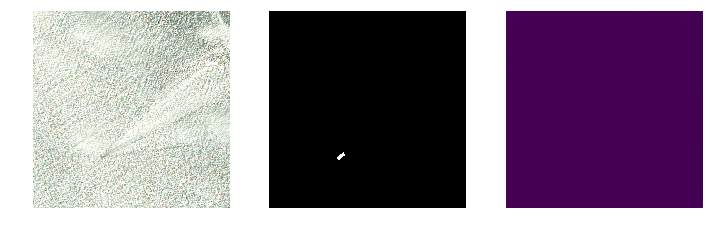

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


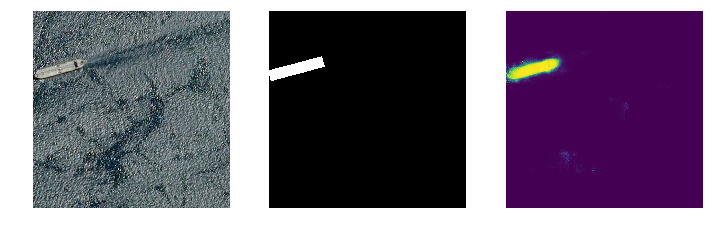

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


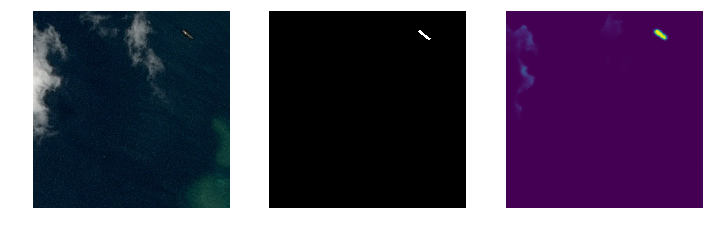

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


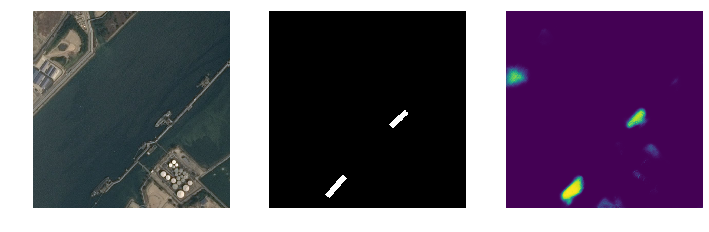

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


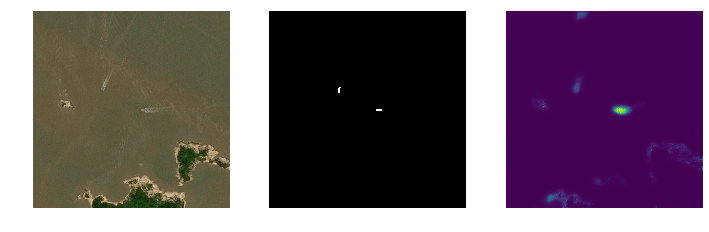

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


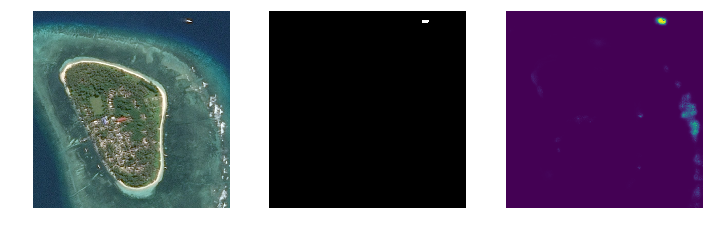

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


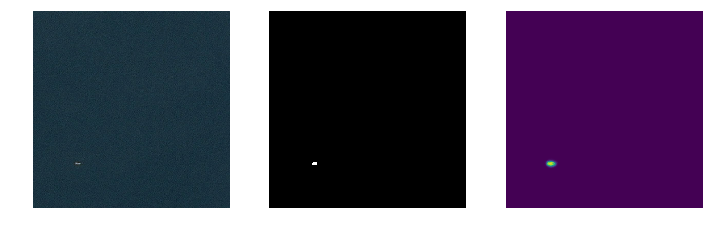

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


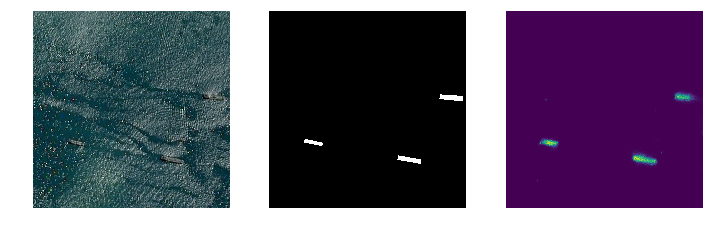

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


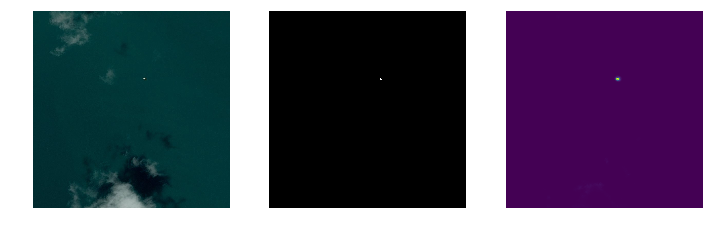

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


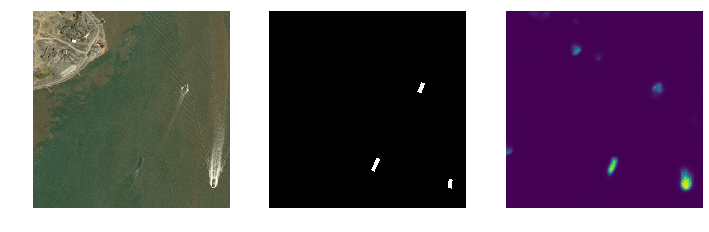

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


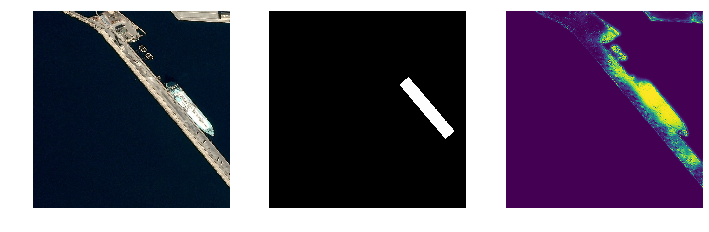

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


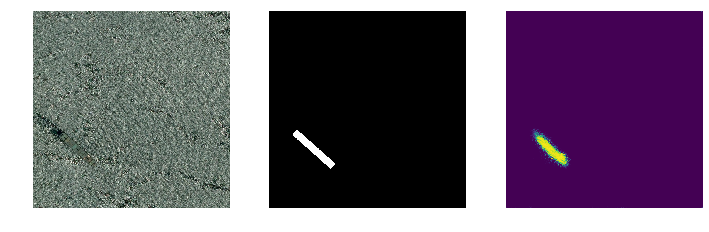

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


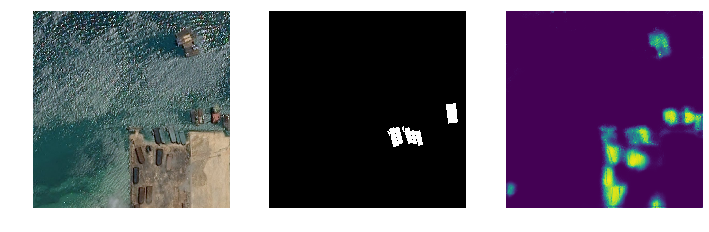

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


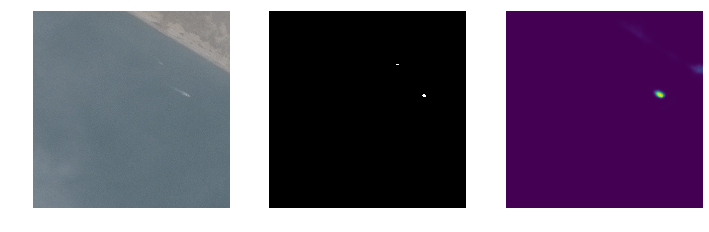

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


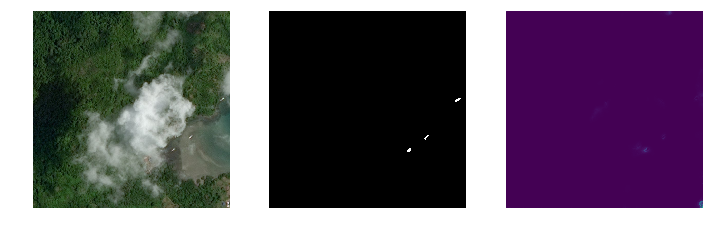

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


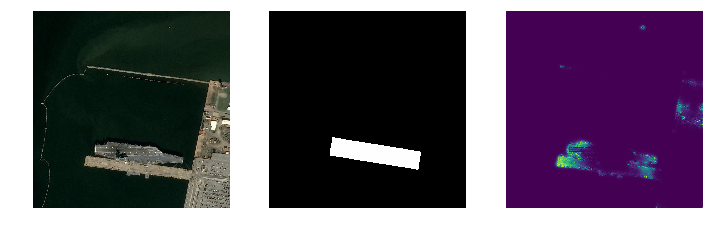

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


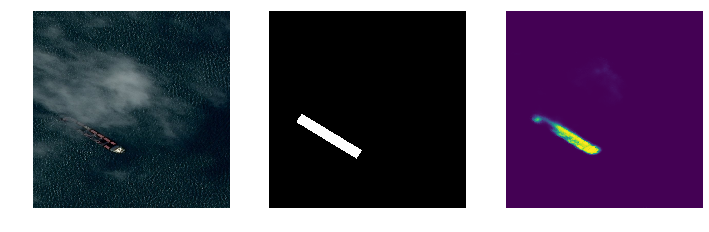

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


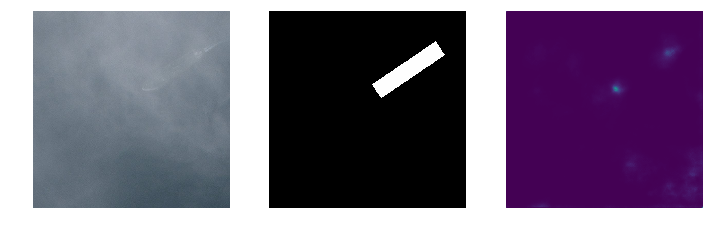

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


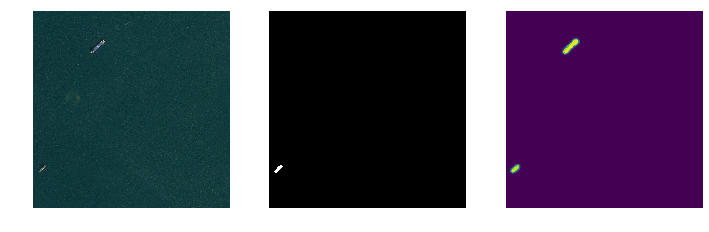

In [28]:
# After 3 epochs of unfreezing - step 5.
disp2.displayFiles(fileList, predImage_dir, target_dir, predMasks)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


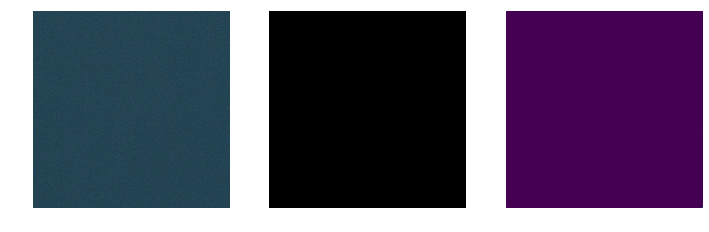

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


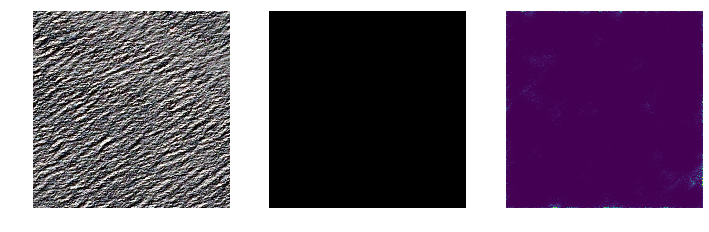

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


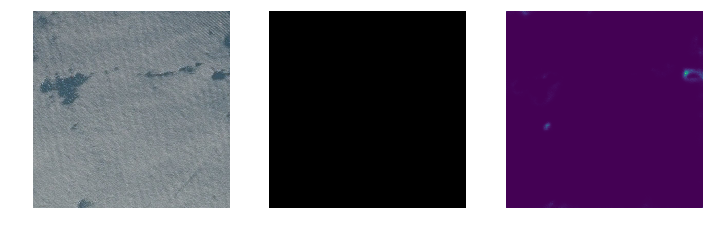

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


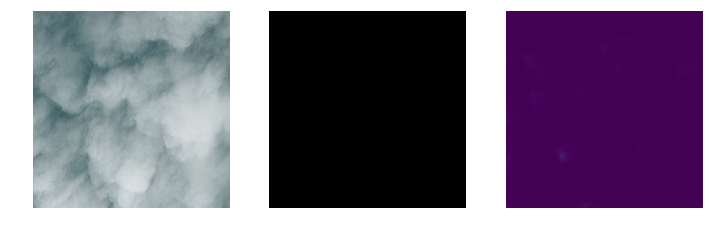

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


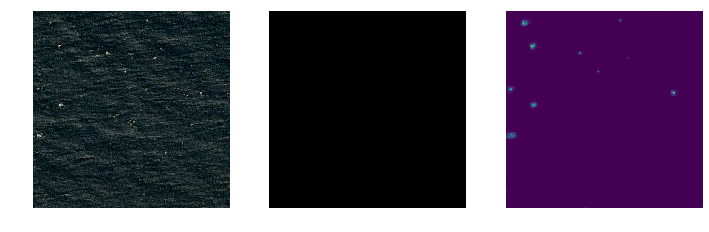

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


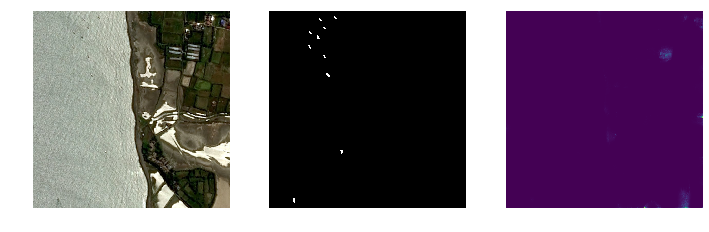

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


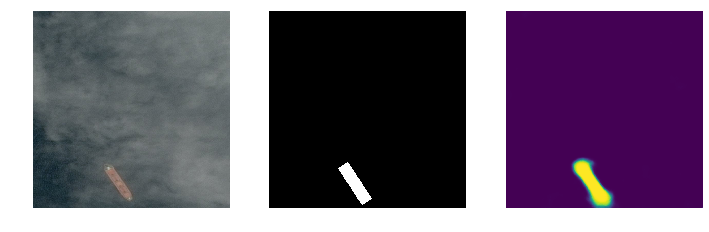

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


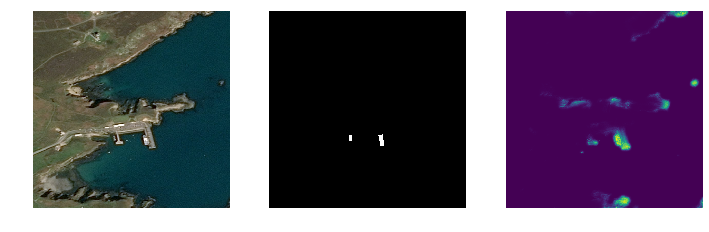

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


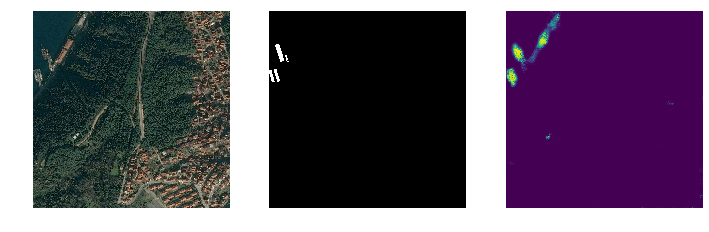

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


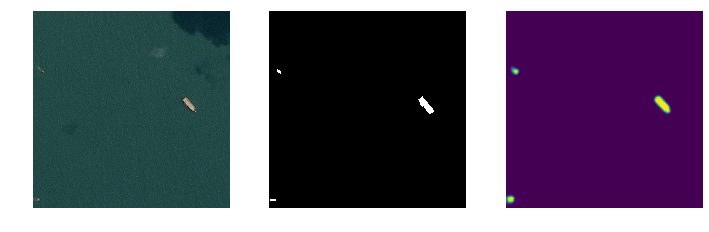

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


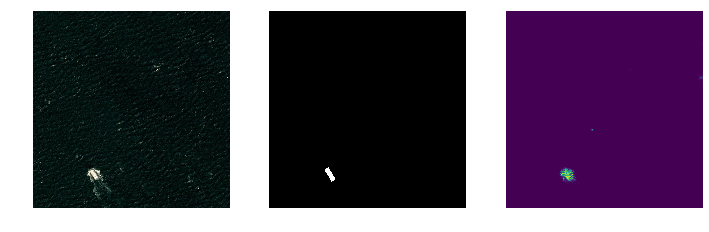

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


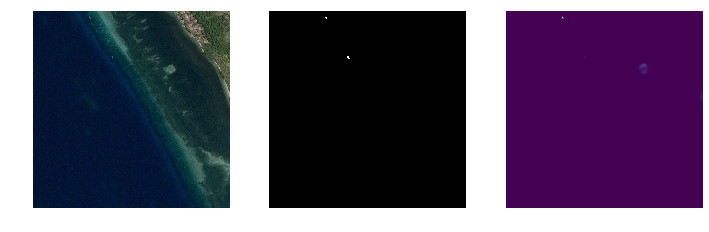

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


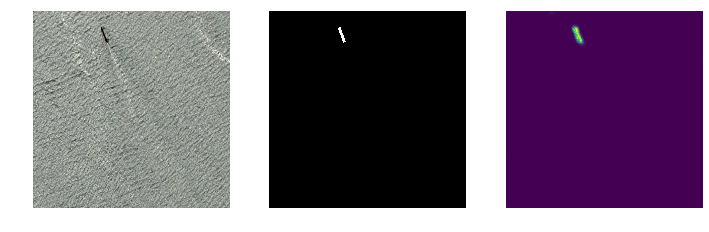

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


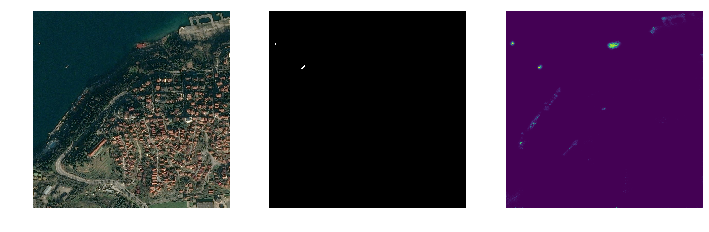

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


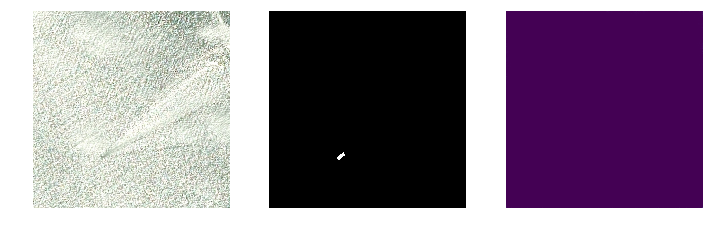

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


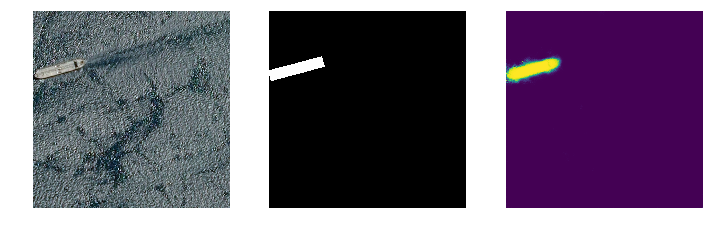

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


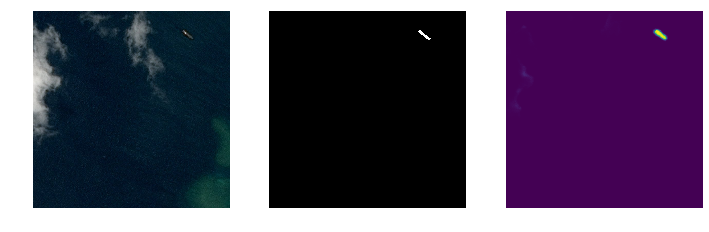

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


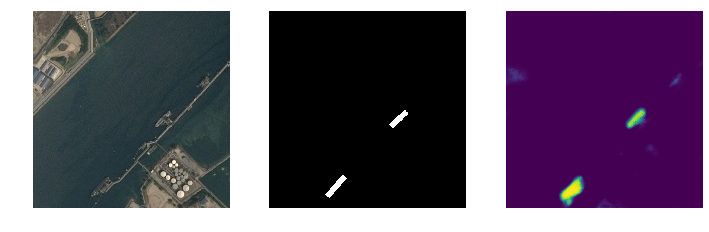

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


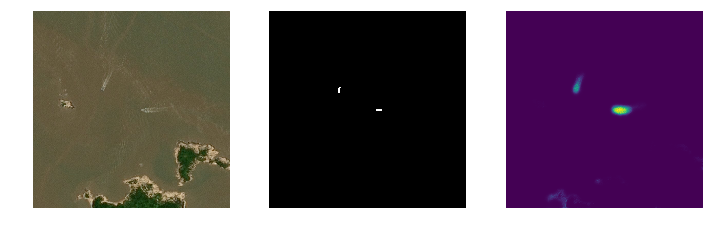

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


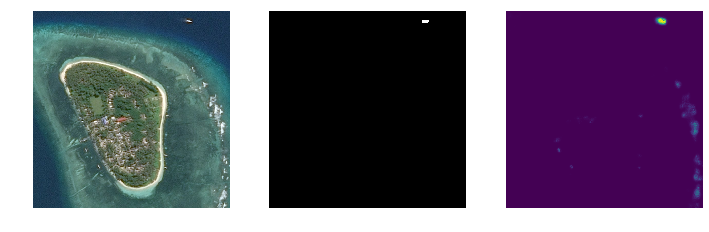

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


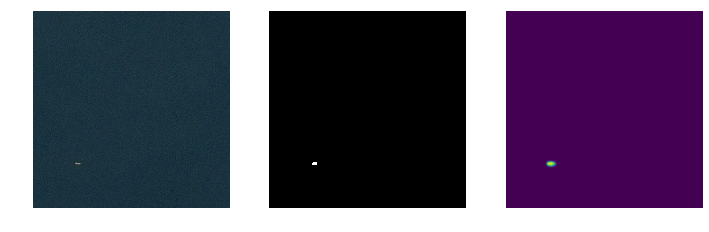

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


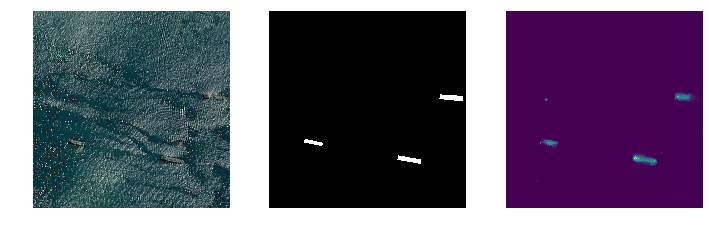

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


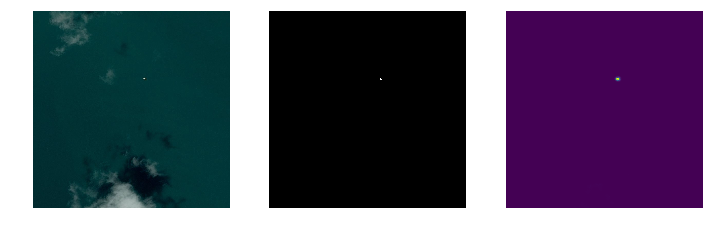

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


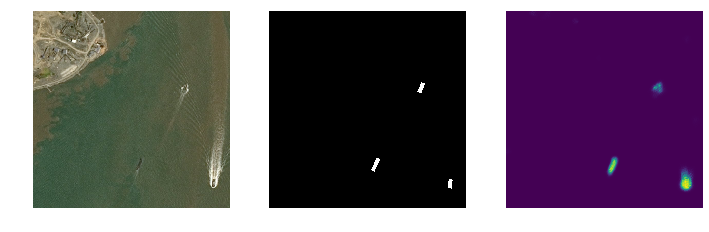

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


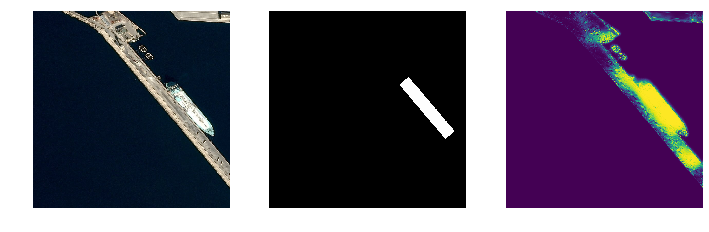

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


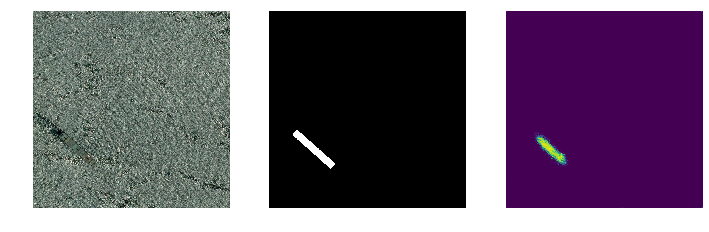

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


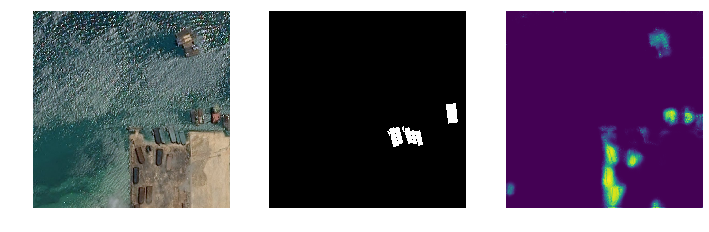

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


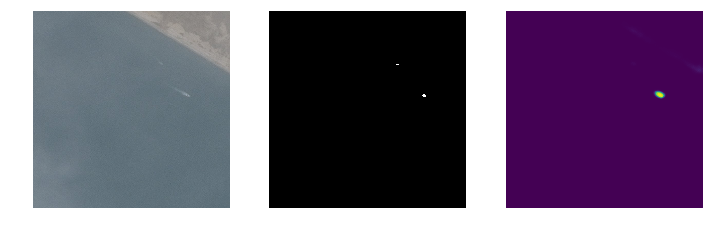

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


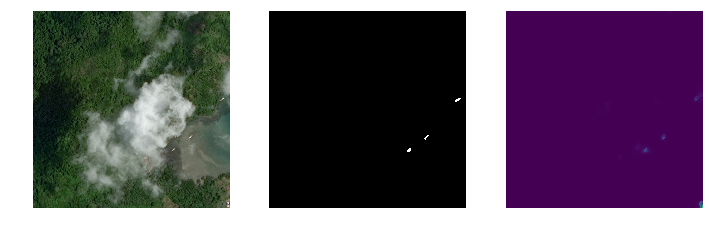

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


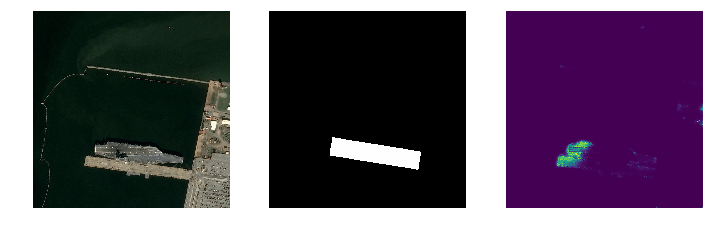

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


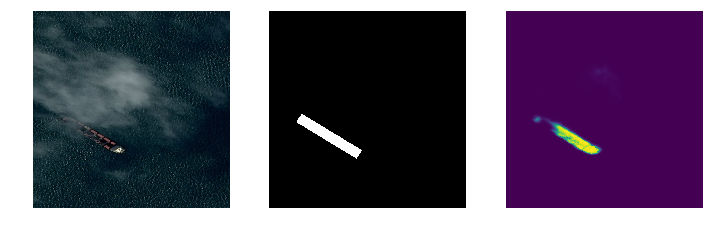

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


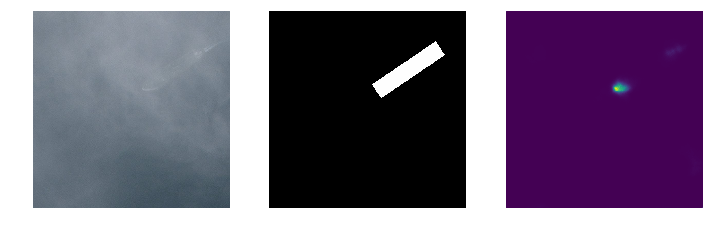

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


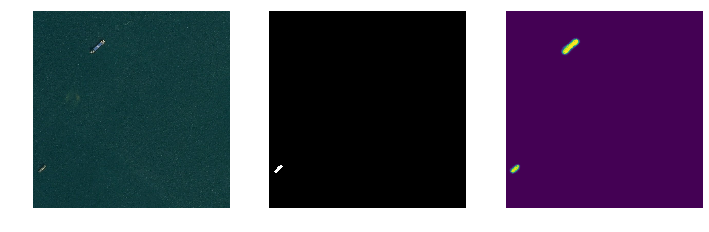

In [39]:
# After 6 more epochs of unfreezing - step 6.
disp2.displayFiles(fileList, predImage_dir, target_dir, predMasks)